In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0532.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0282.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1401.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0914.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0691.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0972.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0818.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0463.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0930.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1323.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1347.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1354.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0704.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0

In [2]:
import tensorflow as tf
from tensorflow import keras
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
print("the current directory content",os.listdir())

the current directory content ['__notebook__.ipynb']


In [4]:
base_dir ="/kaggle/input/brain-tumor-mri-dataset"
os.listdir(base_dir)

['Training', 'Testing']

In [5]:
print("\nContents of train directory:")
print(os.listdir(f'{base_dir}/Training'))

print("\nContents of validation directory:")
print(os.listdir(f'{base_dir}/Testing'))


Contents of train directory:
['pituitary', 'notumor', 'meningioma', 'glioma']

Contents of validation directory:
['pituitary', 'notumor', 'meningioma', 'glioma']


In [6]:
# Explore train data
print("Train directory content glioma", len(os.listdir(os.path.join(base_dir, "Training/glioma"))))
print("Train directory content meningioma", len(os.listdir(os.path.join(base_dir, "Training/meningioma"))))
print("Train directory content No tumor", len(os.listdir(os.path.join(base_dir, "Training/notumor"))))
print("Train directory content pituitary", len(os.listdir(os.path.join(base_dir, "Training/pituitary"))))

Train directory content glioma 1321
Train directory content meningioma 1339
Train directory content No tumor 1595
Train directory content pituitary 1457


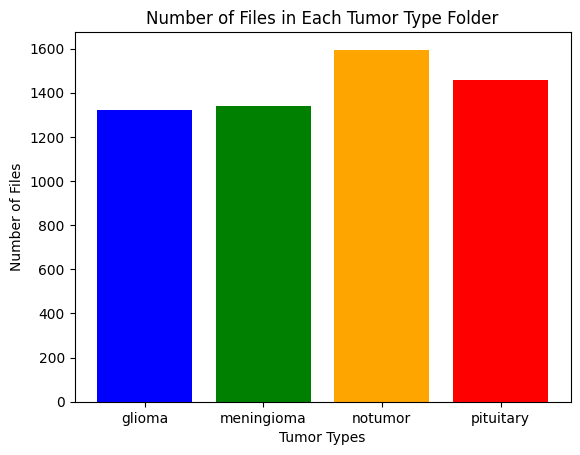

In [7]:
# Define folder paths
folders = ["glioma", "meningioma", "notumor", "pituitary"]
folder_paths = folder_paths = [os.path.join(base_dir, f"Training/{folder}") for folder in folders]

# Get the number of files in each folder
num_files_in_folders = [len(os.listdir(folder_path)) for folder_path in folder_paths]

# Plotting
plt.bar(folders, num_files_in_folders, color=['blue', 'green', 'orange', 'red'])
plt.xlabel('Tumor Types')
plt.ylabel('Number of Files')
plt.title('Number of Files in Each Tumor Type Folder')
plt.show()

In [8]:
# Explore test data
print("Test directory content glioma", len(os.listdir(os.path.join(base_dir, "Testing/glioma"))))
print("Test directory content meningioma", len(os.listdir(os.path.join(base_dir, "Testing/meningioma"))))
print("Test directory content No tumor", len(os.listdir(os.path.join(base_dir, "Testing/notumor"))))
print("Test directory content pituitary", len(os.listdir(os.path.join(base_dir, "Testing/pituitary"))))


Test directory content glioma 300
Test directory content meningioma 306
Test directory content No tumor 405
Test directory content pituitary 300


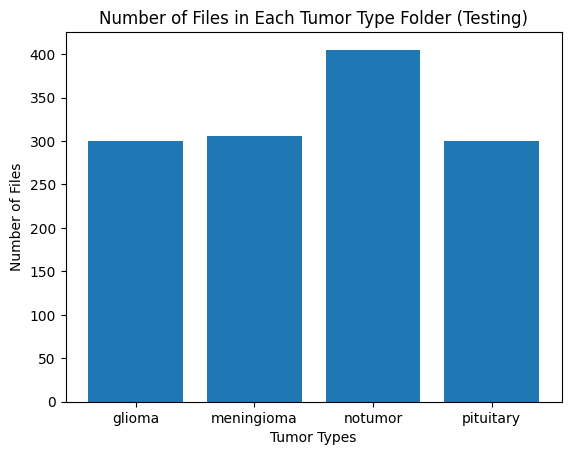

In [9]:
folder_paths_testing = [os.path.join(base_dir, f"Testing/{folder}") for folder in folders]

# Get the number of files in each folder for Testing
num_files_in_folders_testing = [len(os.listdir(folder_path)) for folder_path in folder_paths_testing]

# Plotting
plt.bar(folders, num_files_in_folders_testing)
plt.xlabel('Tumor Types')
plt.ylabel('Number of Files')
plt.title('Number of Files in Each Tumor Type Folder (Testing)')
plt.show()

In [10]:
# Correct the typo in the directory name 'Traning' to 'Training'
train_dir = os.path.join(base_dir, 'Training')

validation_dir = os.path.join(base_dir, 'Testing')

# Directory with our training glioma, meningioma, notumor, pituitary pictures
train_dir_glioma = os.path.join(train_dir, 'glioma')
train_dir_meningioma = os.path.join(train_dir, 'meningioma')
train_dir_notumor = os.path.join(train_dir, 'notumor')
train_dir_pituitary = os.path.join(train_dir, 'pituitary')

# Directory with our validation glioma, meningioma, notumor, pituitary pictures
validation_dir_glioma = os.path.join(validation_dir, 'glioma') 
validation_dir_meningioma = os.path.join(validation_dir, 'meningioma')
validation_dir_notumor = os.path.join(validation_dir, 'notumor')
validation_dir_pituitary = os.path.join(validation_dir, 'pituitary')

Sample Glioma images:


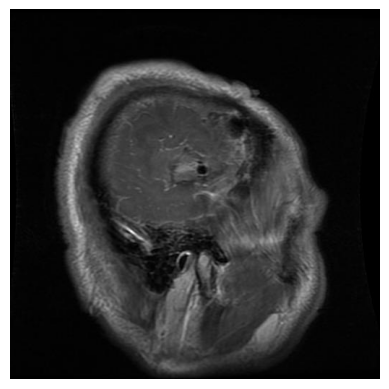

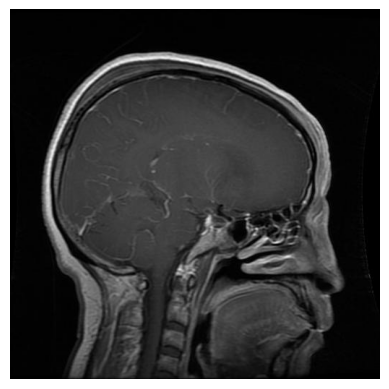

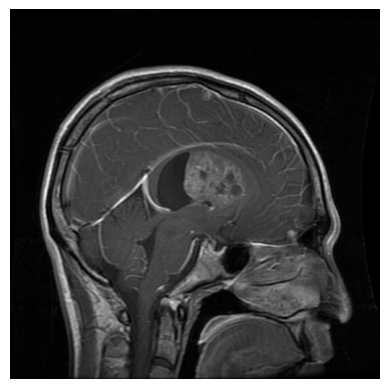

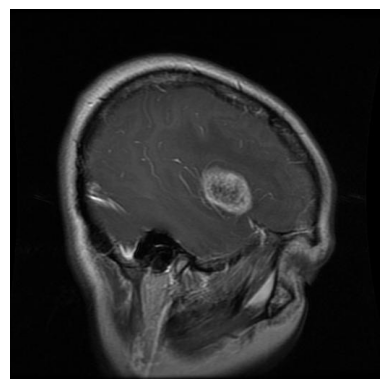

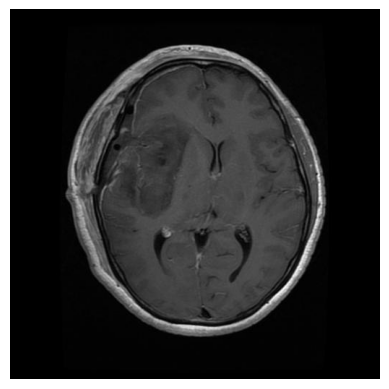

In [11]:
print("Sample Glioma images:")
glioma_train_dir =  "/kaggle/input/brain-tumor-mri-dataset/Training/glioma"

# Get the list of files in the directory
glioma_train_files = os.listdir(glioma_train_dir)

# Display the first 5 images
for i in range(5):
    image_path = os.path.join(glioma_train_dir, glioma_train_files[i])
    img = load_img(image_path)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels
    plt.show()

Sample meningioma images:


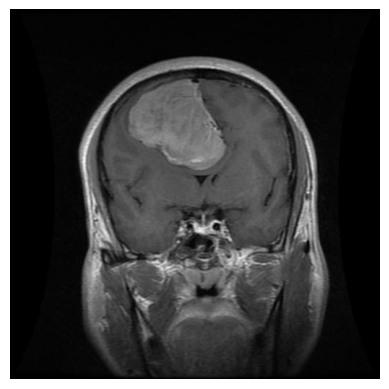

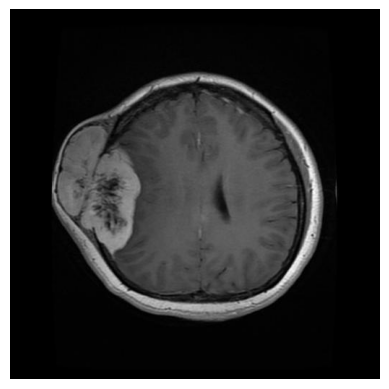

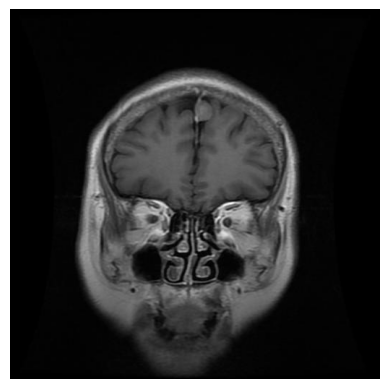

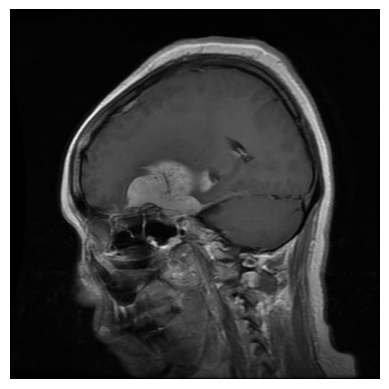

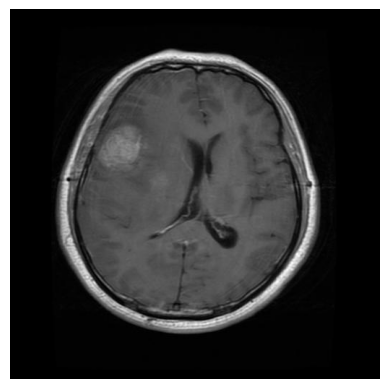

In [12]:
print("Sample meningioma images:")
meningioma_train_dir = "/kaggle/input/brain-tumor-mri-dataset/Training/meningioma"

# Get the list of files in the directory
meningioma_train_files = os.listdir(meningioma_train_dir)

# Display the first 5 images
for i in range(5):
    image_path = os.path.join(meningioma_train_dir,meningioma_train_files[i])
    img = load_img(image_path)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels
    plt.show()

Sample No tumor images:


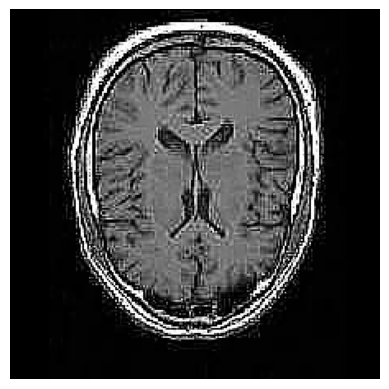

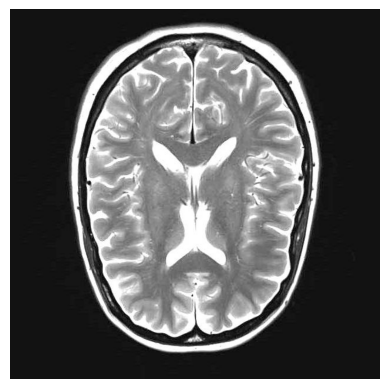

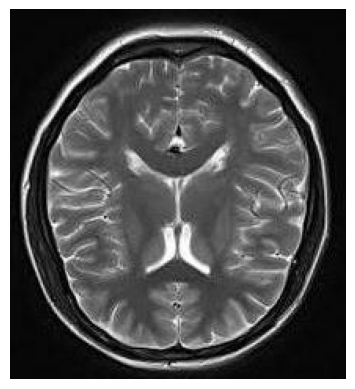

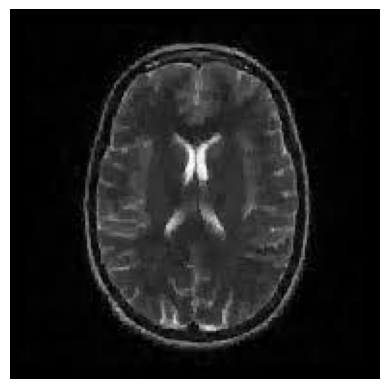

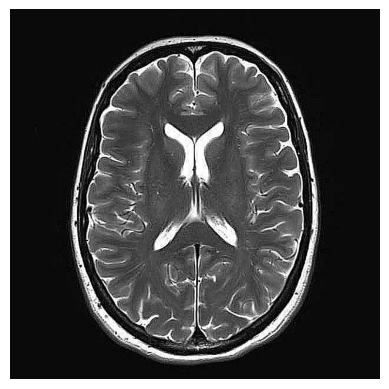

In [13]:
print("Sample No tumor images:")
notumor_train_dir = "/kaggle/input/brain-tumor-mri-dataset/Training/notumor"

# Get the list of files in the directory
notumor_train_files = os.listdir(notumor_train_dir)

# Display the first 5 images
for i in range(5):
    image_path = os.path.join(notumor_train_dir,notumor_train_files[i])
    img = load_img(image_path)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels
    plt.show()

Sample pituitary images:


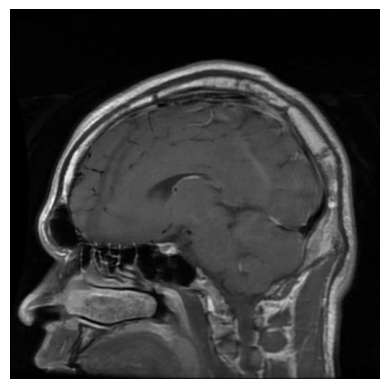

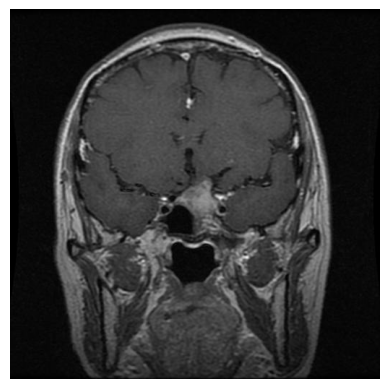

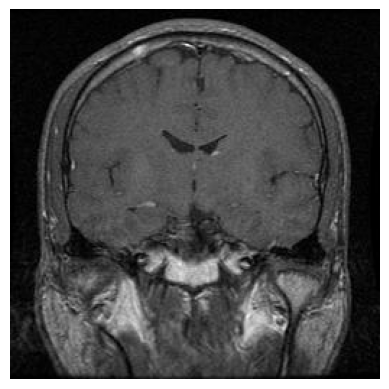

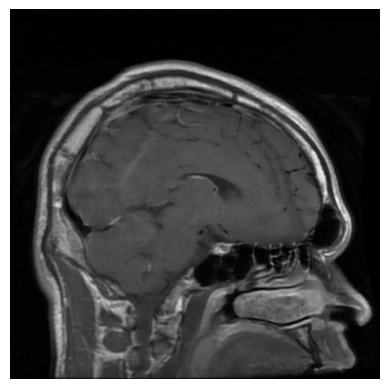

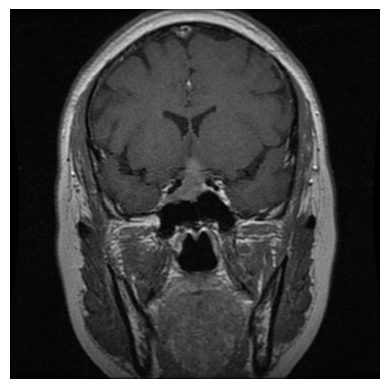

In [14]:
print("Sample pituitary images:")
pituitary_train_dir = "/kaggle/input/brain-tumor-mri-dataset/Training/pituitary"

# Get the list of files in the directory
pituitary_train_files = os.listdir(pituitary_train_dir)

# Display the first 5 images
for i in range(5):
    image_path = os.path.join(pituitary_train_dir,pituitary_train_files[i])
    img = load_img(image_path)
    plt.imshow(img)
    plt.axis('off')  # Turn off axis labels
    plt.show()

In [15]:
#data argumentation on train data and rescale the test data
def train_val_generators(TRAINING_DIR, VALIDATION_DIR):
  # Instantiate the ImageDataGenerator class 
  train_datagen = ImageDataGenerator(rescale=1/255,
                                     rotation_range=120,
                                     width_shift_range=0.12,
                                     height_shift_range=0.12,
                                     shear_range=0.12,
                                     zoom_range=0.12,
                                     horizontal_flip=True,
                                     vertical_flip=True,
                                     brightness_range=[0.5, 1.5],
                                     featurewise_center=True,
                                     featurewise_std_normalization=True,
                                     fill_mode='nearest')

  # Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=32,
                                                      class_mode='categorical',
                                                      target_size=(224, 224))

  # Instantiate the ImageDataGenerator class (don't forget to set the rescale argument)
  validation_datagen = ImageDataGenerator(rescale=1/255)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=32,
                                                                class_mode='categorical',
                                                                target_size=(224, 224))

  return train_generator, validation_generator

In [16]:
train_generator, validation_generator = train_val_generators(TRAINING_DIR=train_dir, VALIDATION_DIR=validation_dir)

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


## Transfer learning

In [17]:
from tensorflow.keras.applications import InceptionResNetV2


In [18]:
# Load the InceptionResNetV2 base model without top classification layers
base_model = InceptionResNetV2(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# Flatten the output layer to 1 dimension
x = keras.layers.Flatten()(base_model.output)

# Add a fully connected layer with 1024 hidden units and ReLU activation
x = Dense(1024, activation='elu')(x)

# Add a dropout rate of 0.1
# = tf.keras.layers.Dropout(0.1)(x)

# Add another fully connected layer with 512 hidden units and ReLU activation
x = Dense(512, activation="elu")(x)

# Add another dropout layer
#x = tf.keras.layers.Dropout(0.1)(x)

# Add a final softmax layer for multi-class classification
output = Dense(4, activation='softmax')(x)

# Create the complete model by using the Model class
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["accuracy"])


219055592/219055592 [==============================] - 1s 0us/step


**alternative optimizer**

Adamax(learning_rate= 0.001)

In [19]:
# Define a Callback class that stops training once accuracy reaches 99.9%
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.989):
      print("\nReached 98.9% accuracy so cancelling training!")
      self.model.stop_training = True
      
callbacks = myCallback()

In [20]:
# Train the model

history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs = 2,
                    verbose = 1, callbacks=[callbacks])

/opt/conda/lib/python3.10/site-packages/keras/src/preprocessing/image.py:1861: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/keras/src/preprocessing/image.py:1871: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/2
179/179 [==============================] - 208s 658ms/step - loss: 1.7546 - accuracy: 0.7409 - val_loss: 1.1310 - val_accuracy: 0.5637
Epoch 2/2
179/179 [==============================] - 85s 475ms/step - loss: 0.3225 - accuracy: 0.8983 - val_loss: 0.3957 - val_accuracy: 0.8818


In [21]:
accuracy_test_set=model.evaluate(validation_generator)
accuracy_test_set

41/41 [==============================] - 4s 104ms/step - loss: 0.3957 - accuracy: 0.8818


[0.3956562280654907, 0.8817696571350098]

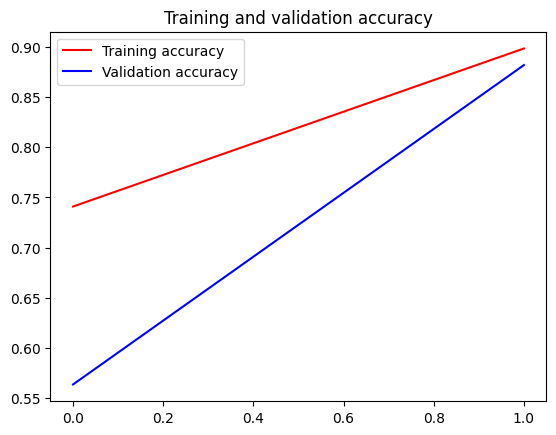

<Figure size 640x480 with 0 Axes>

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

In [23]:
#Picture of a model
keras.utils.plot_model(model, show_layer_names=True, show_shapes=True)

In [24]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

In [25]:
y_pred_prob = model.predict_generator(validation_generator)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = validation_generator.classes

/tmp/ipykernel_26/2905674932.py:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  y_pred_prob = model.predict_generator(validation_generator)


In [26]:
y_pred[:8]

array([3, 1, 0, 1, 3, 0, 3, 1])

In [27]:
y_true[:8]

array([0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

In [29]:
confusion_matrix(y_true, y_pred)

array([[ 71,  71,  83,  75],
       [ 69,  79,  73,  85],
       [100,  87, 110, 108],
       [ 81,  66,  84,  69]])

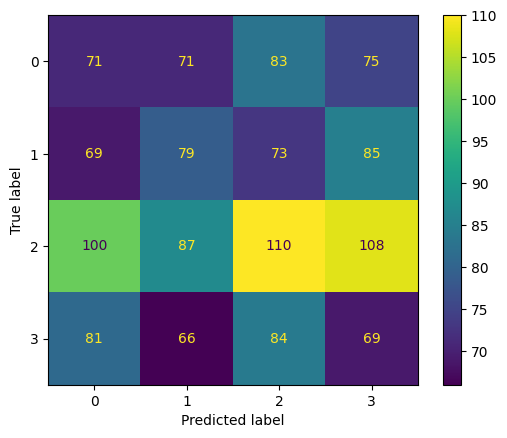

In [30]:
ConfusionMatrixDisplay.from_predictions(y_true, y_pred)

In [31]:
print(classification_report(y_true, y_pred)) 

              precision    recall  f1-score   support

           0       0.22      0.24      0.23       300
           1       0.26      0.26      0.26       306
           2       0.31      0.27      0.29       405
           3       0.20      0.23      0.22       300

    accuracy                           0.25      1311
   macro avg       0.25      0.25      0.25      1311
weighted avg       0.26      0.25      0.25      1311



In [32]:
from sklearn.metrics import accuracy_score

accuracy_score(y_true, y_pred)

0.2509534706331045

In [33]:
model.save('brain_tumor.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
